In [2]:
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pack_padded_sequence
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import datasets, transforms
import torchvision.models as models
from pycocotools.coco import COCO

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

from pycocotools.coco import COCO

from CustomInception import CustomInception3

import os
import collections
import random
import numpy as np
import os
import time
import json
from PIL import Image
from torchsummary import summary
import torch.nn.functional as F
from tqdm.notebook import tqdm, trange
from torchnlp.encoders.text import StaticTokenizerEncoder, stack_and_pad_tensors, pad_tensor
from torchtext.data.utils import get_tokenizer
from nltk.tokenize import WhitespaceTokenizer
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu
import re
from collections import Counter
import sys
import math

# Preprocess dataset

In [3]:
annotation_file = 'captions_train2014.json'
image_dir = 'train/'
num_images = 6000

In [4]:
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

coco=COCO(annotation_file)

loading annotations into memory...
Done (t=0.65s)
creating index...
index created!


In [5]:
def coco_id_to_path(id):
    return image_dir + 'COCO_train2014_' + '%012d.jpg' % id

## Create mapping of image ids to corresponding captions

In [6]:
image_id_to_caption = collections.defaultdict(list)
for val in annotations['annotations']:
    caption = f"<start> {val['caption']} <end>"
    image_id_to_caption[val['image_id']].append(caption)

### Randomly shuffle images

In [7]:
# Set seed
random.seed(0)

image_ids = list(image_id_to_caption.keys())
random.shuffle(image_ids)

selected_ids = image_ids[:num_images]

In [8]:
selected_ids[:5]

[466514, 272143, 309003, 192636, 141889]

### Create lists of image ids and captions with corresponding indices

In [9]:
captions = []
img_id_vector = []
for img_id in selected_ids:
    caption_list = image_id_to_caption[img_id]
    captions.extend(caption_list)
    img_id_vector.extend([img_id] * len(caption_list))

In [10]:
img_id_vector[:5]

[466514, 466514, 466514, 466514, 466514]

## Preprocess and tokenize the captions

* First, you'll tokenize the captions (for example, by splitting on spaces). This gives us a  vocabulary of all of the unique words in the data (for example, "surfing", "football", and so on).
* Next, you'll limit the vocabulary size to the top 5,000 words (to save memory). You'll replace all other words with the token "UNK" (unknown).
* You then create word-to-index and index-to-word mappings.
* Finally, you pad all sequences to be the same length as the longest one.

In [11]:
def filter_punctuations(word):
    return re.sub(r'[!"#$%&()*+.,-\/:;=?@\[\]^_`{|}~]', "", word.lower())

In [12]:
tokenizer = WhitespaceTokenizer()

captions_filtered = [filter_punctuations(caption) for caption in captions]
captions_tokenized = [tokenizer.tokenize(caption) for caption in captions_filtered]

max_caption_length = max([len(caption) for caption in captions_tokenized])
captions_padded = [caption + ["<pad>"] * (max_caption_length - len(caption)) for caption in captions_tokenized]

In [13]:
vocabularySize = 5000
word_counts = Counter([token for tokens in captions_tokenized for token in tokens])
vocabulary = ["<pad>", "<unk>"] + [e[0] for e in word_counts.most_common(vocabularySize-2)]
word2index = {word:index for index,word in enumerate(vocabulary)}
index2word = {index:word for index,word in enumerate(vocabulary)}

Create onehot vectors for every word in the vocabulary

In [14]:
one_hot_embeddings = np.eye(vocabularySize)
word_indices = [[*map(lambda word: word2index.get(word, word2index["<unk>"]), sentence)] for sentence in captions_padded]
word_vectors = [[*map(lambda index: one_hot_embeddings[index], indices)] for indices in word_indices]

## Split the data into training and testing

In [15]:
def vec2word(vector):
    return index2word[np.argmax(vector).item()]

In [16]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_id_vector, word_vectors):
    img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.seed(0)
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_id_train = []
cap_train = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    img_id_train.extend([imgt] * capt_len)
    cap_train.extend(img_to_cap_vector[imgt])

img_id_val = []
cap_val = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    img_id_val.extend([imgv] * capv_len)
    cap_val.extend(img_to_cap_vector[imgv])

## Some dimensions

In [119]:
feature_embedding_dim = 256
word_embedding_dim = 256
vocab_size = vocabularySize

# Depends on chosen feature extractor
vgg = {
    'num_features': 512,
    'features_hw': 9,
    'features_size': 9 * 9
}
deit = {
    'num_features': 768,
    'features_hw': 14,
    'features_size': 14 * 14
}

alex = {
    'num_features': 256,
    'features_hw': 8,
    'features_size': 8 * 8
}

att_dim = 512
dec_dim = 512

## Encoder model

### Feature encoders for the different extractors

In [120]:
class VGG_CNN_encoder(nn.Module):
    def __init__(self, feature_embedding_dim, feature_extractor):
        super(VGG_CNN_encoder, self).__init__()
        # Going from 8 * 8 (64) * 2048 -> 8 * 8 (64) * feature_embedding_dim
        self.feature_extractor = feature_extractor
        self.adaptive_pool = nn.AdaptiveAvgPool2d((9, feature_embedding_dim))
        self.relu = nn.ReLU()
        
        for p in self.feature_extractor.parameters():
            p.requires_grad = False

        for c in list(self.feature_extractor.children())[24:]:
            for p in c.parameters():
                p.requires_grad = True
    def forward(self, x):
        x = self.feature_extractor(x)
        x = x.permute(0, 2, 3, 1)
        x = self.adaptive_pool(x)
        return x

In [121]:
class DeiT_CNN_encoder(nn.Module):
    def __init__(self, feature_embedding_dim, feature_extractor):
        super(DeiT_CNN_encoder, self).__init__()
        # Going from 8 * 8 (64) * 2048 -> 8 * 8 (64) * feature_embedding_dim
        self.feature_extractor = feature_extractor
        self.adaptive_pool = nn.AdaptiveAvgPool2d((deit["features_hw"], feature_embedding_dim))
        self.relu = nn.ReLU()
        
        for p in self.feature_extractor.parameters():
            p.requires_grad = False

        for c in list(deit_fe.children())[2][-1:]:
            for p in c.parameters():
                p.requires_grad = True
    def forward(self, x):
        x = self.feature_extractor(x)
        x = x.view(-1, deit["features_hw"], deit["features_hw"], deit["num_features"])
#         x = x.permute(0, 2, 3, 1)
        x = self.adaptive_pool(x)
        return x

In [144]:
class AlexNet_CNN_encoder(nn.Module):
    def __init__(self, feature_embedding_dim, feature_extractor):
        super(AlexNet_CNN_encoder, self).__init__()
        # Going from 8 * 8 (64) * 2048 -> 8 * 8 (64) * feature_embedding_dim
        self.feature_extractor = feature_extractor
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.feature_extractor(x)
        x = x.permute(0, 2, 3, 1)
        return x

## Visual attention model

In [140]:
class Attention(nn.Module):
    """
    Attention Network.
    """

    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        """
        :param encoder_dim: feature size of encoded images
        :param decoder_dim: size of decoder's RNN
        :param attention_dim: size of the attention network
        """
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  # linear layer to transform encoded image
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  # linear layer to transform decoder's output
        self.full_att = nn.Linear(attention_dim, 1)  # linear layer to calculate values to be softmax-ed
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)  # softmax layer to calculate weights

    def forward(self, encoder_out, decoder_hidden):
        """
        Forward propagation.
        :param encoder_out: encoded images, a tensor of dimension (batch_size, num_pixels, encoder_dim)
        :param decoder_hidden: previous decoder output, a tensor of dimension (batch_size, decoder_dim)
        :return: attention weighted encoding, weights
        """
        att1 = self.encoder_att(encoder_out)  # (batch_size, num_pixels, attention_dim)
        att2 = self.decoder_att(decoder_hidden)  # (batch_size, attention_dim)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)
        alpha = self.softmax(att)  # (batch_size, num_pixels)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, encoder_dim)

        return attention_weighted_encoding, alpha

## RNN Decoder model

In [177]:
class RNN_Decoder(nn.Module):
    def __init__(self, att_dim, word_embedding_dim, feature_embedding_dim, h_size, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.vocab_size = vocab_size
        self.hidden_size = h_size
        self.feature_embedding_dim = feature_embedding_dim
        self.word_embedding_dim = word_embedding_dim
        self.embedding = nn.Embedding(vocab_size, word_embedding_dim, padding_idx=word2index["<pad>"])
        self.gru_step = nn.GRUCell(input_size=word_embedding_dim + feature_embedding_dim, hidden_size=h_size, bias=True)
        self.init_h = nn.Linear(feature_embedding_dim, h_size)  # linear layer to find initial hidden state of GRUCell
        
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(h_size, vocab_size)  # linear layer to find scores over vocabulary
        
        self.attention = Attention(feature_embedding_dim, h_size, att_dim)
        #     self.attention = BahdanauAttention(hidden_size=self.units, key_size=None, query_size=None)
        
    def forward(self, word, features, hidden_state):
        embedded_word = self.embedding(word) # N x numwords x word_embedding_dim
        encoded_out = features.view(-1, alex["features_size"], self.feature_embedding_dim)
        attended_img, attention_weights = self.attention(encoded_out, hidden_state) # N x feature_embedding_dim
        
        # N x feature_embedding_space x word_embedding_space
        rnn_input = torch.cat((attended_img, torch.squeeze(embedded_word).view(-1, self.word_embedding_dim)), dim=1)
        
        hidden = self.gru_step(rnn_input, hidden_state)
        
        output = self.fc(hidden)
        
        return output, hidden, attention_weights
    
    def reset_state(self, batch_size):
        return torch.zeros((batch_size, self.hidden_size))
        

# Training

Create custom dataset

In [178]:
class SimpleDataset(Dataset):
    def __init__(self, image_ids, transform=None):
        self.image_ids = image_ids
        self.transform = transform
        
    def __getitem__(self, index):
        image_path = coco_id_to_path(self.image_ids[index])
        x = Image.open(image_path).convert('RGB')
        x = self.transform(x)
        return x, image_path
    
    def __len__(self):
        return len(self.image_ids)

In [179]:
stat_ds = SimpleDataset(selected_ids[:1000], transform=transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor()
]))
loader = DataLoader(stat_ds, batch_size=32)
mean = 0
std = 0
for images, _ in tqdm(loader):
    batch_samples = images.size(0) # batch size (the last batch can have smaller size!)
    images = images.view(batch_samples, images.size(1), -1)
    mean += images.mean(2).sum(0)
    std += images.std(2).sum(0)

mean /= len(loader.dataset)
std /= len(loader.dataset)

  0%|          | 0/32 [00:00<?, ?it/s]

In [180]:
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
    transforms.RandomHorizontalFlip(0.5)
])

preprocess_deit = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
    transforms.RandomHorizontalFlip(0.5)
])

In [181]:
class CaptionDataset(Dataset):
    def __init__(self, image_ids, captions, transform=None):
        self.image_ids = image_ids
        self.captions = captions
        self.transform = transform
        
    def __getitem__(self, index):
        image_path = coco_id_to_path(self.image_ids[index])
        x = Image.open(image_path).convert('RGB')
        x = self.transform(x)
        caption = self.captions[index]
        return x.detach().numpy(), caption, image_path
    
    def __len__(self):
        return len(set(self.image_ids))
def collate_fn(batch):
    return tuple(zip(*batch))

## Training parameters

In [198]:
epochs = 20
loss_plot = []
load_checkpoint = None
start_epoch = 0
BATCH_SIZE=32
grad_clip = 5.
alpha_c = 1.

criterion = nn.CrossEntropyLoss()

vgg16_model = models.vgg16(pretrained=True)
deit_model = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)
alex_net = models.alexnet(pretrained=True)
alex_fe = alex_net.features

deit_fe = torch.nn.Sequential(*(list(deit_model.children())[:-1]))

# feature_extractor = vgg16_model.features

encoder = AlexNet_CNN_encoder(feature_embedding_dim, alex_fe)


decoder = RNN_Decoder(att_dim, word_embedding_dim, feature_embedding_dim, dec_dim, vocab_size)
encoder_lr = 1e-4  # learning rate for encoder
decoder_lr = 5e-4  # learning rate for decoder

decoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, decoder.parameters()),
                                             lr=decoder_lr)
encoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, encoder.parameters()),
                                             lr=encoder_lr)

Using cache found in /home/jovyan/.cache/torch/hub/facebookresearch_deit_main


In [239]:
vgg_params = sum(p.numel() for p in vgg16_model.parameters())
deit_params = sum(p.numel() for p in deit_model.parameters())
alex_params = sum(p.numel() for p in alex_net.parameters())

In [240]:
print(vgg_params)
print(deit_params)
print(alex_params)

138357544
86567656
61100840


## Load training checkpoint if specified

In [200]:
if load_checkpoint is not None:
    checkpoint = torch.load(load_checkpoint)
    encoder.load_state_dict(checkpoint["encoder"])
    decoder.load_state_dict(checkpoint["decoder"])
    
    encoder_optimizer = checkpoint["encoder_optimizer"]
    decoder_optimizer = checkpoint["decoder_optimizer"]
    start_epoch = checkpoint["epoch"]

## Train data

In [201]:
train_dataset = CaptionDataset(img_id_train, cap_train, preprocess)
train_loader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=BATCH_SIZE, drop_last=True, shuffle=True)

In [202]:
def clip_gradient(optimizer, grad_clip):
    """
    Clips gradients computed during backpropagation to avoid explosion of gradients.
    :param optimizer: optimizer with the gradients to be clipped
    :param grad_clip: clip value
    """
    for group in optimizer.param_groups:
        for param in group['params']:
            if param.grad is not None:
                param.grad.data.clamp_(-grad_clip, grad_clip)

In [203]:
def train_step(img_tensor, target, teacher_forcing=True, print_sentence=False):
    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])
    
    dec_input = torch.unsqueeze(torch.Tensor([word2index['<start>']] * target.shape[0]), 1).long()
    
    img_tensor = torch.Tensor(img_tensor)
    features = encoder(img_tensor).reshape(BATCH_SIZE, alex["features_hw"], alex["features_hw"], 256)
    
    # Iterate over each word in the target caption
    predictions = torch.zeros(target.shape[0], max_caption_length, vocab_size)
    predictions[:, 0, word2index['<start>']] = 1
    
    # Calculate length of longest caption in current batch
    lengths = ((torch.argmax(target, dim=2) == word2index["<end>"]).nonzero(as_tuple=False)+1)[:, 1].tolist()
    max_length = max(lengths)

    for i in range(1, max_length):
        target_word = target[:, i]  # N x Vocab size 
        target_idx = torch.argmax(target_word, dim=1).long() # N
        pred_scores, hidden, alphas = decoder(dec_input, features, hidden)
        pred_word = torch.argmax(pred_scores, dim=1).long()
        
        predictions[:, i] = pred_scores

        # TEACHER FORCING
#         if teacher_forcing:
        dec_input = target_idx
#         else:
#             dec_input = torch.argmax(pred_scores, dim=1)
    targets = target.argmax(dim=2)
    pred_packed = pack_padded_sequence(predictions[:, 1:], lengths, batch_first=True, enforce_sorted = False)
    targets_packed = pack_padded_sequence(targets[:, 1:], lengths, batch_first=True, enforce_sorted = False)
    loss = criterion(pred_packed.data, targets_packed.data)
    
    loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()
    
    if print_sentence:
        pred_words = list(torch.argmax(predictions, dim=2)[0])
        target_sentence = list(target.argmax(dim=2)[0])
        print("predicted:")
        print(" ".join(list(map(lambda x: index2word[x.item()], pred_words))))
        print("target:")
        print(" ".join(list(map(lambda x: index2word[x.item()], target_sentence))))
        print(loss)
    
    sentence = " ".join(list(map(lambda x: index2word[x.item()], torch.argmax(predictions, dim=2)[0])))
              
    decoder_optimizer.zero_grad()
    encoder_optimizer.zero_grad()
    loss.backward()
    
    clip_gradient(decoder_optimizer, grad_clip)
    encoder_optimizer.step()
    decoder_optimizer.step()
        
    # Calculate average loss per word
    total_loss = (loss / int(target.shape[1]))
    return loss, total_loss

  0%|          | 0/20 [00:00<?, ?it/s]

predicted:
<start> dough taste pokes timer pokes taste timer lean taste taste dough dough dough dough dough dough <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a white motorcycle parked on the cross walk <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(8.5072, grad_fn=<AddBackward0>)
Epoch 1 Batch 0 Loss 0.1736
predicted:
<start> a a modified a a double a a a a a a a bacon a a a a a a a <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a couple of traffic lights sitting at a street corner by a building <end

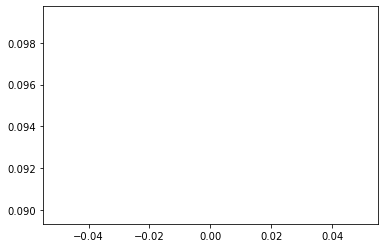

Epoch 1 Loss 0.094538
Time taken for 1 epoch 497.50 sec

Epoch 2 Batch 0 Loss 0.0833
predicted:
<start> a man with with a in in a table <end> a field <end> <end> <pad> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a road sign and stop sign on a post near a telephone pole <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(3.7973, grad_fn=<AddBackward0>)
Epoch 2 Batch 100 Loss 0.0701
predicted:
<start> a man and is a man and is <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <p

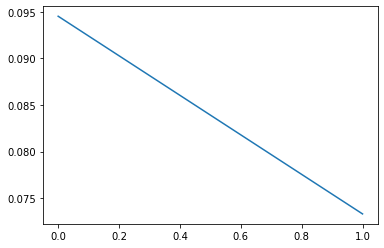

Epoch 2 Loss 0.073296
Time taken for 1 epoch 503.45 sec

Epoch 3 Batch 0 Loss 0.0632
predicted:
<start> a is a of with a and a <end> a <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> birds on grassy area with fruit for consumption on ground <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(3.3275, grad_fn=<AddBackward0>)
Epoch 3 Batch 100 Loss 0.0640
predicted:
<start> a person photo white airplane bus on a street <end> <pad> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pa

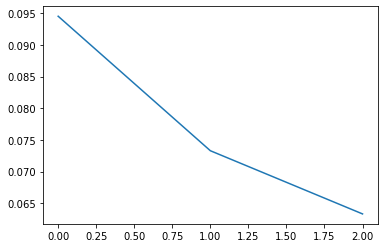

Epoch 3 Loss 0.063314
Time taken for 1 epoch 502.97 sec

Epoch 4 Batch 0 Loss 0.0597
predicted:
<start> a baseball is a baseball bat of to catch a ball <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a pitcher in a baseball game about to throw the ball <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(2.8971, grad_fn=<AddBackward0>)
Epoch 4 Batch 100 Loss 0.0522
predicted:
<start> a baseball is a baseball bat a baseball <end> a field <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <

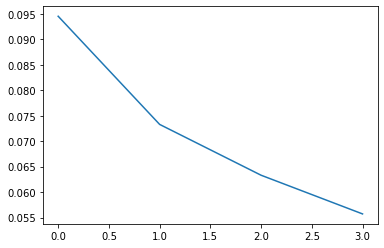

Epoch 4 Loss 0.055714
Time taken for 1 epoch 508.65 sec

Epoch 5 Batch 0 Loss 0.0517
predicted:
<start> a man in on fish in on on a water <end> <pad> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a seagull eats a fish while floating on the water <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(2.6021, grad_fn=<AddBackward0>)
Epoch 5 Batch 100 Loss 0.0436
predicted:
<start> a snow fire hydrant is standing the tall <end> <end> <pad> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <

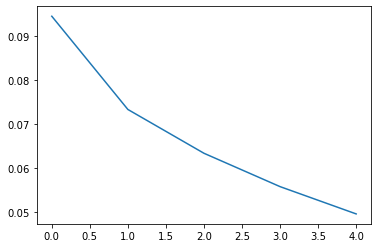

Epoch 5 Loss 0.049495
Time taken for 1 epoch 504.23 sec

Epoch 6 Batch 0 Loss 0.0440
predicted:
<start> a large is is with down a street <end> <pad> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a giant elephant statue walking down a street <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(2.0562, grad_fn=<AddBackward0>)
Epoch 6 Batch 100 Loss 0.0413
predicted:
<start> a is and and and they <unk> a <unk> is is in <end> <pad> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <p

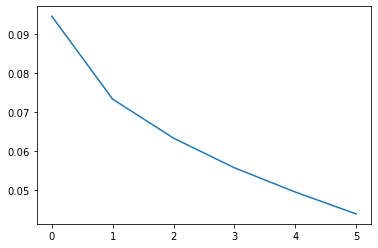

Epoch 6 Loss 0.043895
Time taken for 1 epoch 569.79 sec

Epoch 7 Batch 0 Loss 0.0390
predicted:
<start> a men in in a beds beds in a another on a table <end> <pad> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> two men laying in single sized beds as one talks on a phone <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(2.1047, grad_fn=<AddBackward0>)
Epoch 7 Batch 100 Loss 0.0399
predicted:
<start> a people are to a beds of a kitchen bed <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <p

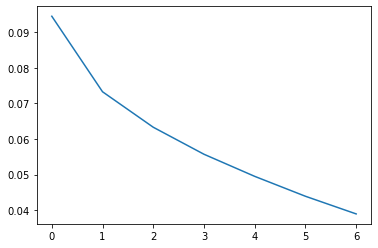

Epoch 7 Loss 0.038929
Time taken for 1 epoch 504.23 sec

Epoch 8 Batch 0 Loss 0.0300
predicted:
<start> a pile of gold scissors sit sitting on to a and a knife on cord on the ground <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a pile of gold scissors are stacked next to equipment and a taped electric cord on the pavement <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(1.8397, grad_fn=<AddBackward0>)
Epoch 8 Batch 100 Loss 0.0322
predicted:
<start> a laptop computer sitting a wooden counter top <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <

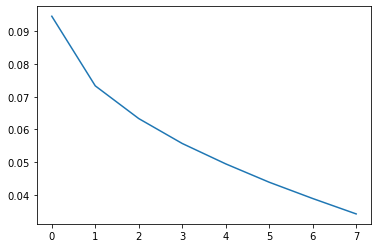

Epoch 8 Loss 0.034225
Time taken for 1 epoch 516.41 sec

Epoch 9 Batch 0 Loss 0.0292
predicted:
<start> a living room with with a couch and a chair <end> <pad> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a living room scene with the couch and the chair <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(1.4905, grad_fn=<AddBackward0>)
Epoch 9 Batch 100 Loss 0.0308
predicted:
<start> a fighter jets parked on a foggy runway <end> <pad> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>

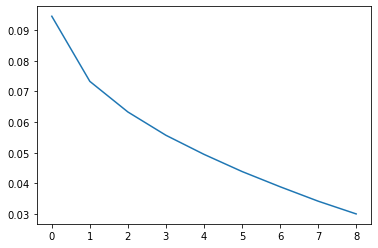

Epoch 9 Loss 0.030064
Time taken for 1 epoch 513.03 sec

Epoch 10 Batch 0 Loss 0.0272
predicted:
<start> a man water a pair of water skiing on a of a lake <end> <pad> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a man riding a pair of water skis on top of a lake <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(1.3048, grad_fn=<AddBackward0>)
Epoch 10 Batch 100 Loss 0.0263
predicted:
<start> a is a image of a baseball game with a in a plate <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<

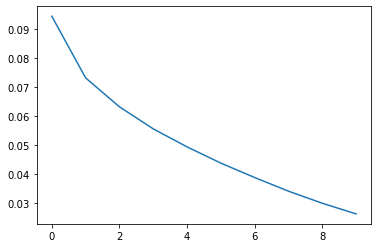

Epoch 10 Loss 0.026388
Time taken for 1 epoch 513.38 sec

Epoch 11 Batch 0 Loss 0.0211
predicted:
<start> a small small boat on a placid lake <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a single small boat on a placid lake <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(1.0197, grad_fn=<AddBackward0>)
Epoch 11 Batch 100 Loss 0.0218
predicted:
<start> a zebra standing in the middle of the grassy area area <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <

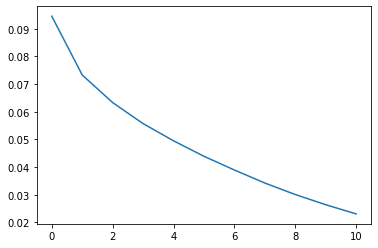

Epoch 11 Loss 0.023057
Time taken for 1 epoch 504.95 sec

Epoch 12 Batch 0 Loss 0.0186
predicted:
<start> a plane and red airplane ascends into the sky <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a white and red airplane ascends into the sky <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.9328, grad_fn=<AddBackward0>)
Epoch 12 Batch 100 Loss 0.0212
predicted:
<start> a wooden of fruits and vegetables on a counter <end> <pad> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <p

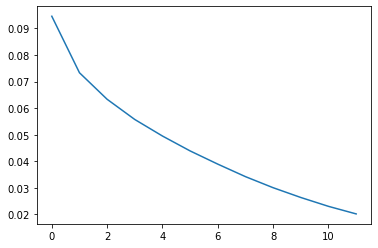

Epoch 12 Loss 0.020212
Time taken for 1 epoch 548.84 sec

Epoch 13 Batch 0 Loss 0.0178
predicted:
<start> a women have their hands in a box of donuts <end> <pad> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> two people have their hands above a box of donuts <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.9149, grad_fn=<AddBackward0>)
Epoch 13 Batch 100 Loss 0.0180
predicted:
<start> a living large living room with a the furnishings <end> <pad> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pa

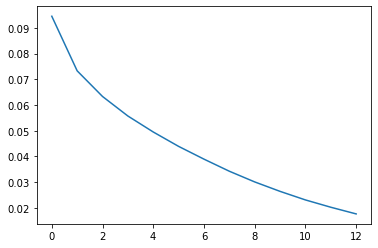

Epoch 13 Loss 0.017614
Time taken for 1 epoch 542.25 sec

Epoch 14 Batch 0 Loss 0.0135
predicted:
<start> a of roses displayed on table alongside electronic computer equipment <end> <pad> <end> <end> <end> <end> <end> on <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> vase with roses displayed on table alongside electronic computer equipment <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.7101, grad_fn=<AddBackward0>)
Epoch 14 Batch 100 Loss 0.0159
predicted:
<start> a zebra standing a grassy field of grass with a sky background <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <p

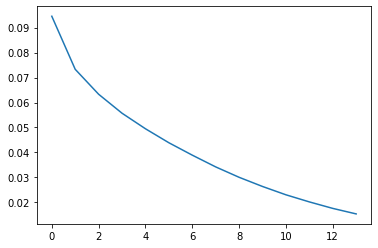

Epoch 14 Loss 0.015401
Time taken for 1 epoch 507.29 sec

Epoch 15 Batch 0 Loss 0.0123
predicted:
<start> a girl sits on a rickshaw talking on the telephone <end> <pad> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a girl sitting in a rickshaw talking on the telephone <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.5955, grad_fn=<AddBackward0>)
Epoch 15 Batch 100 Loss 0.0128
predicted:
<start> a person skis down a snowy near to snowcovered trees <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <

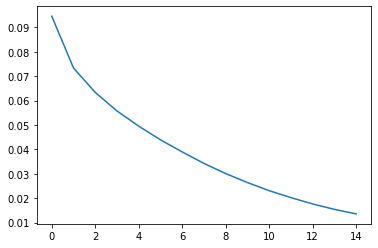

Epoch 15 Loss 0.013533
Time taken for 1 epoch 516.84 sec

Epoch 16 Batch 0 Loss 0.0109
predicted:
<start> a cat and gray cat laying on top of a bed <end> <pad> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a white and gray cat laying on top of a bed <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.5264, grad_fn=<AddBackward0>)
Epoch 16 Batch 100 Loss 0.0124
predicted:
<start> two man in blue shorts stands on a street near a man in red shorts <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> 

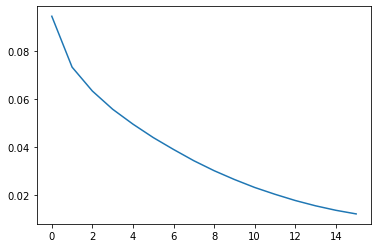

Epoch 16 Loss 0.012019
Time taken for 1 epoch 522.32 sec

Epoch 17 Batch 0 Loss 0.0091
predicted:
<start> a bathroom with construction with a sink and toilet <end> <pad> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a bathroom under construction with a sink and toilet <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.4759, grad_fn=<AddBackward0>)
Epoch 17 Batch 100 Loss 0.0100
predicted:
<start> a aerial view of a rocky mountain range <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <p

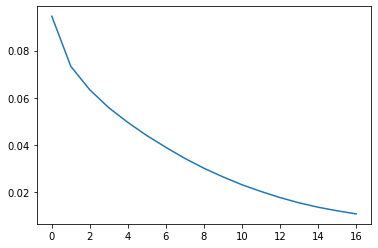

Epoch 17 Loss 0.010693
Time taken for 1 epoch 526.65 sec

Epoch 18 Batch 0 Loss 0.0086
predicted:
<start> two men shaking hands and posing for a picture <end> <pad> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> two men shaking hands and posing for a picture <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.3704, grad_fn=<AddBackward0>)
Epoch 18 Batch 100 Loss 0.0102
predicted:
<start> an bed with a unmade bed between lamps and a mirror <end> <pad> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <

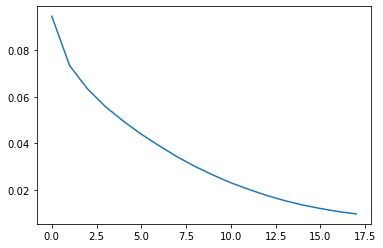

Epoch 18 Loss 0.009687
Time taken for 1 epoch 524.94 sec

Epoch 19 Batch 0 Loss 0.0075
predicted:
<start> a dog is eating from food from a dog bowl <end> <pad> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a dog is eating his food from a dog bowl <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.3568, grad_fn=<AddBackward0>)
Epoch 19 Batch 100 Loss 0.0098
predicted:
<start> a tennis standing on a tennis court holding a tennis racquet <end> <pad> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pa

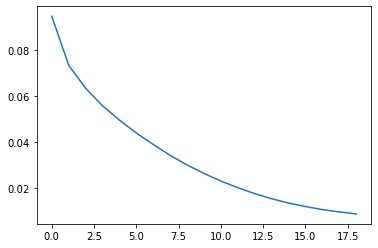

Epoch 19 Loss 0.008817
Time taken for 1 epoch 587.05 sec

Epoch 20 Batch 0 Loss 0.0070
predicted:
<start> a woman walking with her surfboard after surfing <end> <pad> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
target:
<start> a woman walking with her surfboard after surfing <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
tensor(0.3035, grad_fn=<AddBackward0>)
Epoch 20 Batch 100 Loss 0.0091
predicted:
<start> a fire hydrants have been painted many colors <end> <pad> <end> <end> <end> and and and <end> and and and and <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>

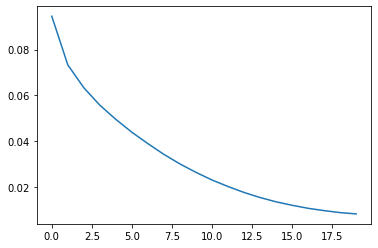

Epoch 20 Loss 0.008247
Time taken for 1 epoch 522.06 sec



In [204]:
loss_plot = []
print_sentence = True
encoder.train()
decoder.train()
teacher_forcing = True

for epoch in trange(start_epoch, epochs):
    start = time.time()
    total_loss = 0
    prev_img_tensor = None
    prev_path = None
    if epoch >= 10:
        teacher_forcing = False
    for (batch, (img_tensor, target, path)) in enumerate(train_loader):
        target = torch.Tensor(target)
        batch_loss, t_loss = train_step(img_tensor, target, teacher_forcing, print_sentence)

        total_loss += t_loss
        print_sentence = False
        if batch % 100 == 0:
            average_batch_loss = batch_loss.item()/int(target.shape[1])
            print_sentence = True
            tqdm.write(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss.item() / len(train_loader))
    
    plt.plot(loss_plot)
    plt.show()

    tqdm.write(f'Epoch {epoch+1} Loss {total_loss/len(train_loader):.6f}')
    tqdm.write(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')
    
    state = {'epoch': epoch,
             'decoder': decoder.state_dict(),
             'encoder': encoder.state_dict(),
             'loss_plot': loss_plot,
             'decoder_optimizer': decoder_optimizer,
             'encoder_optimizer': encoder_optimizer
            }
    filename = 'checkpoint_alex_' + str(epoch) + '.pth.tar'
    torch.save(state, filename)

In [150]:
state = {'epoch': epoch,
         'decoder': decoder.state_dict(),
         'encoder': encoder.state_dict(),
         'loss_plot': loss_plot,
         'decoder_optimizer': decoder_optimizer,
         'encoder_optimizer': encoder_optimizer
        }
filename = 'checkpoint_alex_' + str(epoch) + '.pth.tar'
torch.save(state, filename)

In [206]:
torch.save(decoder, "alexdecoder")

# Evaluation

In [207]:
# TODO use beam search
def caption_image(encoder, decoder, img_tensor, beam=3):
    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=1)
    
    dec_input = torch.unsqueeze(torch.Tensor([word2index['<start>']] * 1), 1).long()

    features = encoder(torch.Tensor(img_tensor)).reshape(1, alex["features_hw"], alex["features_hw"], feature_embedding_dim)
    
    # Iterate over each word in the target caption
    predictions = torch.zeros(1, max_caption_length, vocab_size)
    predictions[:, 0, word2index['<start>']] = 1
    sentence = ["<start>"]
    for i in range(1, max_caption_length):
        pred_scores, hidden, alphas = decoder(dec_input, features, hidden)
        pred_word = torch.argmax(pred_scores, dim=1)
        probs, top_words = torch.topk(pred_scores, k=beam, dim=1, sorted=True)
        
        predictions[:, i] = pred_scores
        
        dec_input = pred_word
        sentence.append(index2word[pred_word.item()])
        if index2word[pred_word.item()] == "<end>":
            break

    return sentence

## Create custom dataset useful for evaluation

In [208]:
class ValDataset(Dataset):
    def __init__(self, image_ids, cap_map, transform=None):
        self.image_ids = image_ids
        self.cap_map = cap_map
        self.transform = transform
    
    def __getitem__(self, index):
        image_path = coco_id_to_path(self.image_ids[index])
        x = Image.open(image_path).convert('RGB')
        x = self.transform(x)
        captions = self.cap_map[self.image_ids[index]]
        return x.detach().numpy(), captions, image_path
    
    def __len__(self):
        return len(self.image_ids)

## Load data and models to evaluate

In [209]:
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

preprocess_deit = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

In [210]:
val_dataset = ValDataset(img_name_val_keys, image_id_to_caption, preprocess)
val_loader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=1, drop_last=True, shuffle=True)

In [216]:
checkpoint = torch.load("checkpoint_alex_19.pth.tar")
encoder = torch.load("alexencoder")
encoder.eval()

val_decoder = RNN_Decoder(att_dim, word_embedding_dim, feature_embedding_dim, dec_dim, vocab_size)
val_decoder.load_state_dict(checkpoint["decoder"])
val_decoder.eval()

RNN_Decoder(
  (embedding): Embedding(5000, 256, padding_idx=0)
  (gru_step): GRUCell(512, 512)
  (init_h): Linear(in_features=256, out_features=512, bias=True)
  (sigmoid): Sigmoid()
  (fc): Linear(in_features=512, out_features=5000, bias=True)
  (attention): Attention(
    (encoder_att): Linear(in_features=256, out_features=512, bias=True)
    (decoder_att): Linear(in_features=512, out_features=512, bias=True)
    (full_att): Linear(in_features=512, out_features=1, bias=True)
    (relu): ReLU()
    (softmax): Softmax(dim=1)
  )
)

In [220]:
hypotheses = []
references = []
random.seed(0)
for (i, (img_tensor, captions, path)) in enumerate(tqdm(val_loader)):
    sentence = caption_image(encoder, val_decoder, img_tensor)
    sentence = " ".join(sentence)
#     img = Image.open(path[0]).convert('RGB').show()
#     print(sentence)
#     print(captions[0])
    references.append(captions[0])
    hypotheses.append(sentence)
#     break

#     sentence_flipped = caption_image(encoder, val_decoder, torch.Tensor(img_tensor).flip(dims=(2,)))
#     img = Image.open(path[0]).convert('RGB').transpose(Image.FLIP_LEFT_RIGHT).show()
#     print(sentence_flipped)

  0%|          | 0/1200 [00:00<?, ?it/s]

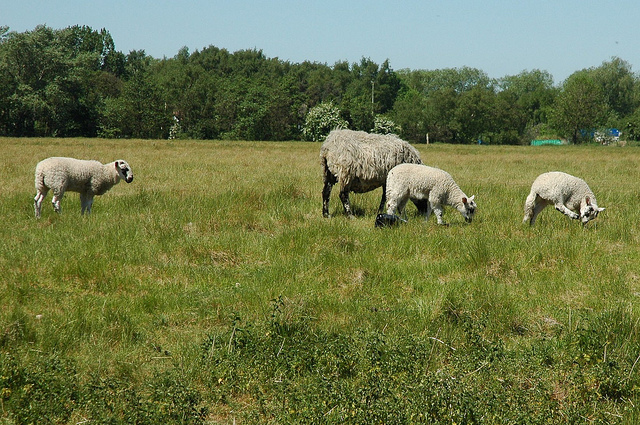

Predicted:
 a herd of cows grazing in a field of grass 

Reference captions:
 Several small sheep and one really large sheep eating grass. 
 Four sheep are grazing in a field with green grass. 
 Several sheep grazing in the grass on a sunny day. 
 A group of animals walking through a field. 
 Four sheep are grazing in a grassy field. 


In [176]:
sentence = caption_image(encoder, val_decoder, img_tensor)
sentence = " ".join(sentence)
img = Image.open(path[0]).convert('RGB').show()

print("Predicted:")
print(sentence.replace("<start>", "").replace("<end>", ""))
print("")
print("Reference captions:")
for caption in captions[0]:
    print(caption.replace("<start>", "").replace("<end>", ""))

In [221]:
corpus_bleu(references, hypotheses)

0.6135640070571405

In [87]:
print(hypotheses[30])
print(references[30])

<start> a man and a black and white photo of a field <end>
['<start> A boy riding his skate board against a cement wall in a rural area. <end>', '<start> A skateboarder rails on a wall as cars go through an intersection. <end>', '<start> A man who is on a skateboard on a ledge. <end>', '<start> A street leading into an intersection with cars traveling on both street and a skateboarder on the side doing a jumping trick onto a side wall. <end>', '<start> Cars driving through an intersection on a steel slope.  <end>']


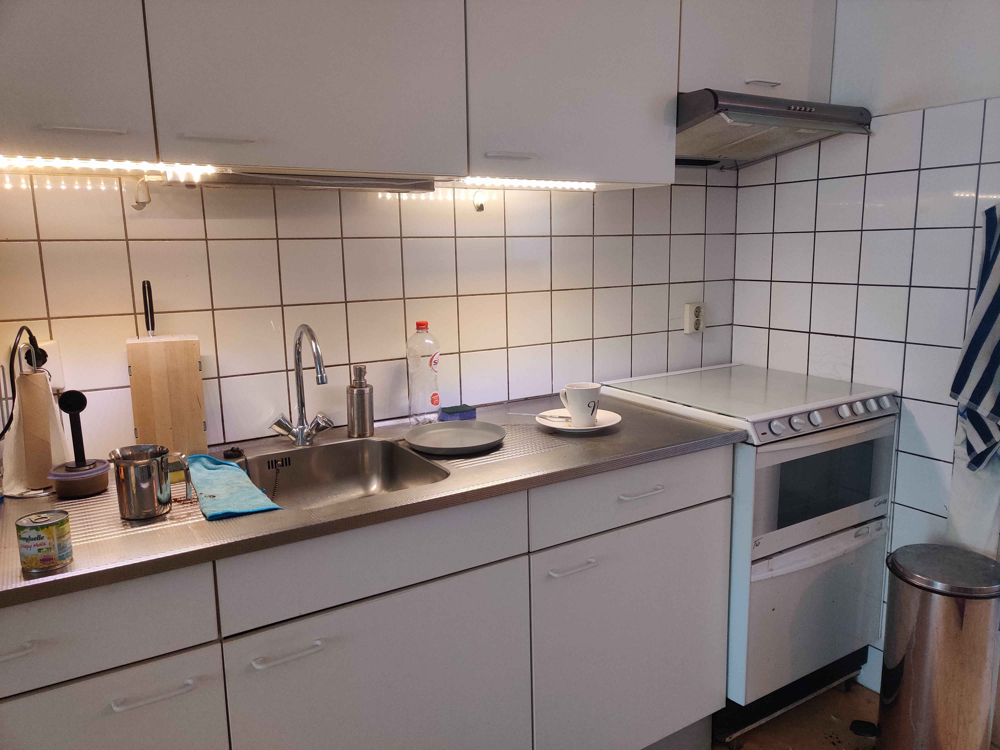

<start> a kitchen with a sink oven stove blender in a kitchen <end>


In [238]:


myimg = "myimages/IMG_20210617_163059.jpg"

x = Image.open(myimg).convert('RGB')
x_norm = preprocess(x).unsqueeze(0).detach().numpy()


sentence = caption_image(encoder, val_decoder, x_norm)
sentence = " ".join(sentence)
x.show()
print(sentence)